## **Calcolo dell'evapotraspirazione con Priestley-Taylor**

### Università degli Studi di Trento - Corso di Idrologia
### Autori:

- Giulia Omilli   209480
- Aya Essamih   209743
- Maria Eugenia Boccardi     209189

## Sommario

In questo Notebook rappresentiamo gli output relativi all'evapotraspirazione e al calore latente calcolati con il modello di Priestley-Taylor.
I dati sono relativi al bacino 1 del Cavone. Gli output sono calcolati tramite i corrispondenti file della console.

### **Descrizione del modello**
La formulazione del modello di Priestley-taylor è data dalla seguente equazione:

\begin{equation}
ET_{0}^{PT} = \alpha\dfrac{\Delta\cdot (R_{n} - G)}{\Delta+\gamma}
\end{equation}
Con:
\begin{equation}
 G =  \begin{cases}
   G_{morn}\cdot R_{n} \quad daylight\\G_{night}\cdot R_{n} \quad nighttime
   \end{cases} 
\end{equation}
Dove:
- $ET_{0}$ o $ET$ sono espresse in [$mm \cdot day^{−1}$] or [$mm\cdot hour^{−1}$]; 
- $R_{n}$ è la radiazione netta espressa in [$MJ \cdot m^{2} \cdot day^{−1}$] o [$MJ \cdot m^{2}\cdot h^{−1}$]; 
- $G$ è il flusso di calore sulla superficie del suolo espresso in [$MJ \cdot m^{2} \cdot day^{−1}$] o [$MJ \cdot m^{2}\cdot h^{−1}$], $G_{morn}$ durante il giorno e $G_{night}$ durante la notte; 
- $\Delta$ è la pendenza della curva saturazione vapore-pressione espressa in ($kP_{a}\dot °C^{−1}$); 
- $\gamma$ è la costante psicrometrica espressa in ($kP_{a} \cdot$ °$C^{−1}$); 
- $\alpha$ è un parametro adimensionale. Il valore medio è 1.26

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import plotly.express as px
import os
import plotly.graph_objects as go
from GEOSPACE_Output import*

In [3]:
oms_project_path = os.path.dirname(os.getcwd())
os.chdir(oms_project_path+'/output/Cavone/1')

## Lettura degli output - Priestley-Taylor

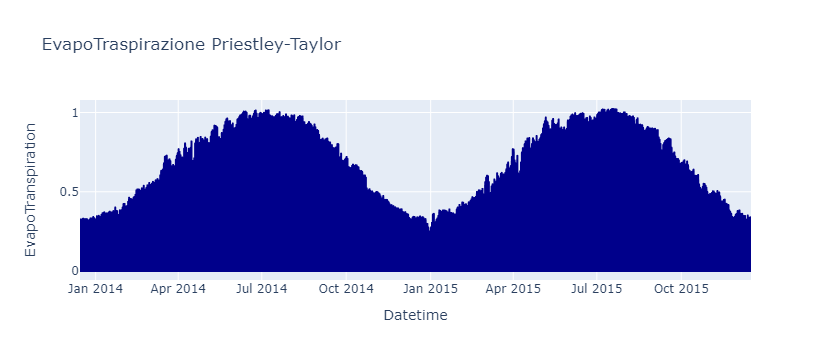

In [6]:
df = pd.read_csv('Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df.columns = ['Datetime','EvapoTranspiration']
fig = px.line(df, x='Datetime', y='EvapoTranspiration', title='EvapoTraspirazione Priestley-Taylor')
fig.update_traces(line_color='darkblue')
fig.show()

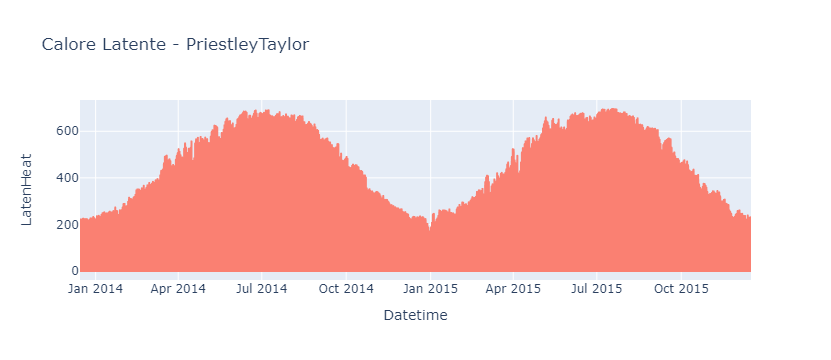

In [10]:
df2 = pd.read_csv('LatentHeat_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df2.columns = ['Datetime','LatenHeat']
fig = px.line(df2, x='Datetime', y='LatenHeat', title='Calore Latente - PriestleyTaylor')
fig.update_traces(line_color='salmon')
#fig.update_xaxes(rangeslider_visible=True)
fig.show()

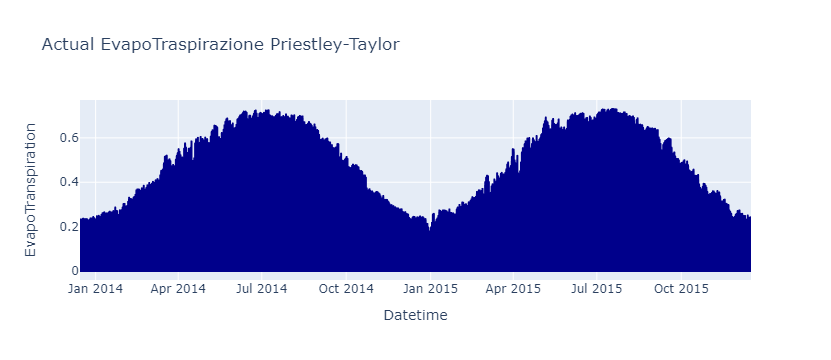

In [11]:
df3 = pd.read_csv('WaterStressEvapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df3.columns = ['Datetime','EvapoTranspiration']
fig = px.line(df3, x='Datetime', y='EvapoTranspiration', title='Actual Evapotraspirazione Priestley-Taylor')
fig.update_traces(line_color='darkblue')
#fig.update_xaxes(rangeslider_visible=True)
fig.show()

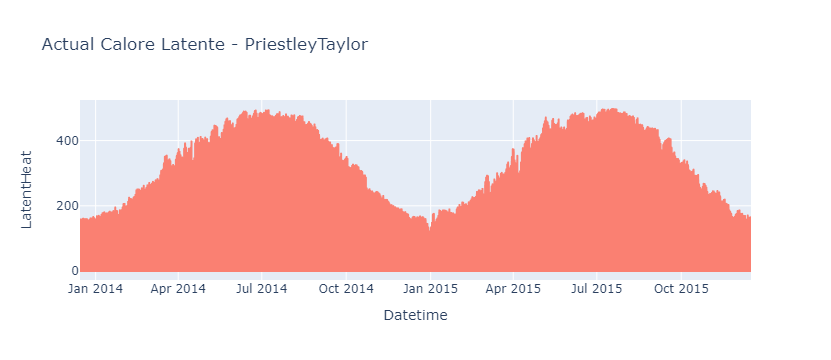

In [12]:
df4 = pd.read_csv('WaterStressLatentHeat_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df4.columns = ['Datetime','LatentHeat']
fig = px.line(df4, x='Datetime', y='LatentHeat', title='Actual Calore Latente - PriestleyTaylor')
fig.update_traces(line_color='salmon')
#fig.update_xaxes(rangeslider_visible=True)
fig.show()

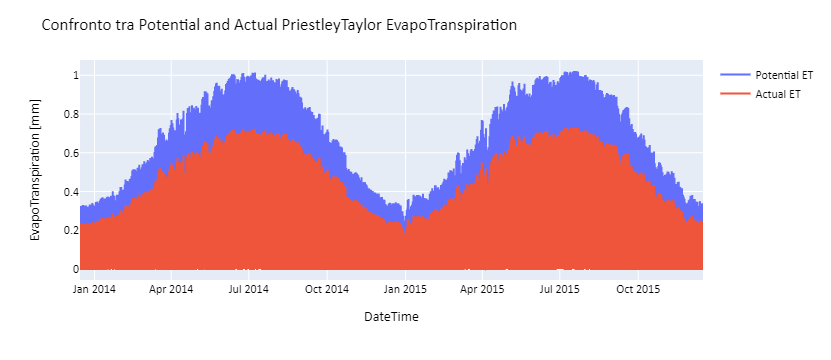

In [16]:
fig = px.line()
fig.add_trace(go.Scatter(x=df['Datetime'], y=df['EvapoTranspiration'], mode='lines', name='Potential ET'))
fig.add_trace(go.Scatter(x=df3['Datetime'], y=df3['EvapoTranspiration'], mode='lines', name='Actual ET'))

fig.update_layout(
    title='Confronto tra Potential and Actual PriestleyTaylor EvapoTranspiration ',
    xaxis_title="DateTime",
    font_family="Calibri",
    font_color="Black",
    title_font_family="Calibri",
    title_font_color="Black",
    yaxis_title="EvapoTranspiration [mm]",
    #legend_title="Date",
    font=dict(size=12))
fig.show()

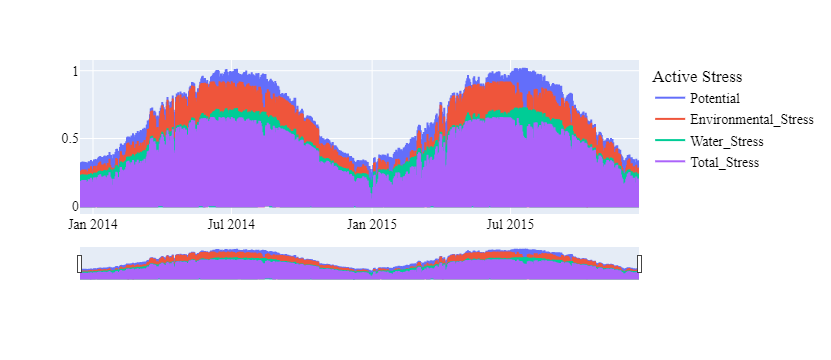

In [17]:
show_stress('Evapotranspiration_PT_1.csv',
            'EnvironmentalEvapotranspiration_PT_1.csv',
            'WaterStressEvapotranspiration_PT_1.csv',
            'TotalEvapotranspiration_PT_1.csv')